<a href="https://colab.research.google.com/github/nemanja899/Deforestation-U-NET/blob/master/UnetDeforestation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install tensorflow==2.8

In [ ]:
pip install georasters

In [ ]:
import tensorflow as tf
import numpy as np
#import tensorflow_io as tfio
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import array_to_img
#import georaster


In [ ]:
tf.__version__

'2.8.2'

In [ ]:
import os
import numpy as np 
import pandas as pd 

import imageio

import matplotlib.pyplot as plt
%matplotlib inline

path = ''
image_path = os.path.join(path, './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/')
mask_path = os.path.join(path, './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/')

image_path_val=os.path.join(path, './drive/MyDrive/ColabNotebooks/Dataset/data/Validation/images/')
mask_path_val=os.path.join(path, './drive/MyDrive/ColabNotebooks/Dataset/data/Validation/masks/')

image_path_test=os.path.join(path, './drive/MyDrive/ColabNotebooks/Dataset/data/Test/')

image_path_final=os.path.join(path, "./drive/MyDrive/ColabNotebooks/Dataset/Sentinel-POI-Collection/nafta, rastvoreni gas i slobodni gas/")

image_list = os.listdir(image_path)
mask_list = os.listdir(mask_path)

image_list_val=os.listdir(image_path_val)
mask_list_val=os.listdir(mask_path_val)

image_list_test=os.listdir(image_path_test)
image_list_final=os.listdir(image_path_final)

image_list = [image_path+i for i in image_list]
mask_list = [mask_path+i for i in mask_list]

image_list_val=[image_path_val+i for i in image_list_val ]
mask_list_val=[mask_path_val+i for i in mask_list_val]

image_list_test=[image_path_test+i for i in image_list_test]

image_list_final=[image_path_final+i for i in image_list_final]

In [ ]:
image_list.sort()
mask_list.sort()

image_list_val.sort()
mask_list_val.sort()

image_list_test.sort()

In [ ]:
image_list

['./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1110.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1154.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_122.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_124.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1279.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1377.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1561.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_170.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1712.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_181.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_323.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_390.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/

In [ ]:
mask_list.sort()

In [ ]:
mask_list

['./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1110.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1154.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_122.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_124.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1279.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1377.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1561.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_170.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1712.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_181.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_323.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_390.png',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Training/mas

Text(0.5, 1.0, 'Segmentation')

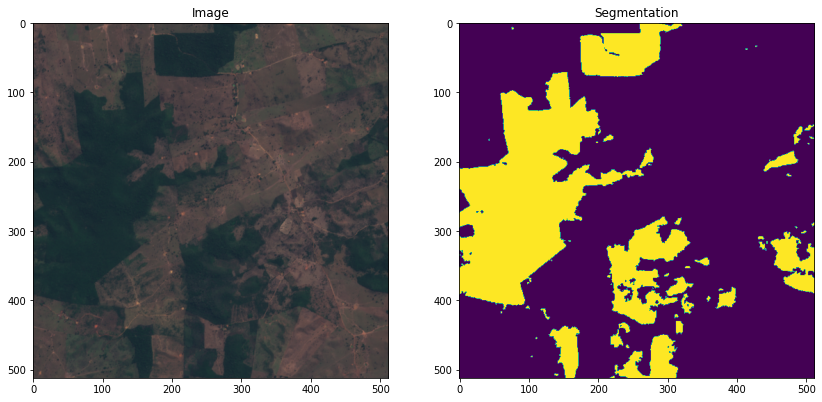

In [ ]:
N = 3
img = imageio.imread(image_list[N])
mask = imageio.imread(mask_list[N])
#mask = np.array([max(mask[i, j]) for i in range(mask.shape[0]) for j in range(mask.shape[1])]).reshape(img.shape[0], img.shape[1])

fig, arr = plt.subplots(1, 2, figsize=(14, 10))
arr[0].imshow(img)
arr[0].set_title('Image')
arr[1].imshow(mask)
arr[1].set_title('Segmentation')

In [ ]:
mask.shape

(512, 512)

In [ ]:
image_list_ds = tf.data.Dataset.list_files(image_list, shuffle=False)
mask_list_ds = tf.data.Dataset.list_files(mask_list, shuffle=False)

image_list_val_ds=tf.data.Dataset.list_files(image_list_val, shuffle=False)
mask_list_val_ds = tf.data.Dataset.list_files(mask_list_val, shuffle=False)

image_list_test_ds=tf.data.Dataset.list_files(image_list_test, shuffle=False)

image_list_final_ds=tf.data.Dataset.list_files(image_list_final, shuffle=False)

for path in zip(image_list_ds.take(3), mask_list_ds.take(3)):
    print(path)

(<tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1110.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1110.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_1154.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1154.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_122.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_122.png'>)


In [ ]:
image_filenames = tf.constant(image_list)
masks_filenames = tf.constant(mask_list)

image_val_filenames= tf.constant(image_list_val)
masks_val_filenames= tf.constant(mask_list_val)

image_test_filenames= tf.constant(image_list_test)
image_final_filenames=tf.constant(image_list_test)

dataset = tf.data.Dataset.from_tensor_slices((image_filenames, masks_filenames))

dataset_val=tf.data.Dataset.from_tensor_slices((image_val_filenames,masks_val_filenames))

dataset_test=tf.data.Dataset.from_tensor_slices(image_test_filenames)

dataset_final=tf.data.Dataset.from_tensor_slices(image_final_filenames)

for image, mask in dataset.take(4):
    print(image)
    print(mask)

tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_323.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_390.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_390.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_822.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_404.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_1561.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/images/Amazon_5.png', shape=(), dtype=string)
tf.Tensor(b'./drive/MyDrive/ColabNotebooks/Dataset/data/Training/masks/Amazon_720.png', shape=(), dtype=string)


In [ ]:
image_list_test

['./drive/MyDrive/ColabNotebooks/Dataset/data/Test/0.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/1.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/10.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/11.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/12.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/13.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/14.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/2.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/3.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/4.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/5.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/6.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/7.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/8.tiff',
 './drive/MyDrive/ColabNotebooks/Dataset/data/Test/9.tiff']

In [ ]:
from PIL import Image
im = Image.open(image_list_test[0])
im.show()

In [ ]:
I = plt.imread(image_list_test[0])

In [ ]:
from tensorflow.python.framework import random_seed

def process_path(image_path=None, mask_path=None):
  img_list=[]
  mask_list=[]
  for im,msk in zip(image_path,mask_path):
    image = tf.io.read_file(im)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)

    mask = tf.io.read_file(msk)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    slice= 128
    i=0
    while i<4:
        start=i*slice
        end=(i+1)*slice
        input_image = tf.image.resize(image[start:end,start:end,:], (256, 256), method='nearest')
        input_mask = tf.image.resize(mask[start:end,start:end,:], (256, 256), method='nearest')
        img_list.append(input_image)
        mask_list.append(input_mask)
        i+=1
  return img_list, mask_list

    #mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)
def process_path_test(image_path):
  img_array=[]
  for im in image_path:
    image =  plt.imread(im)/255
    input_image = tf.image.resize(image, (256, 256), method='nearest')
    img_array.append(np.array(input_image))
  return img_array

def process_path_final(image_path):
  img_array=[]
  for im in image_path:
   # image=georaster.MultiBandRaster(im)
    image=plt.imread(im)/255
    #image=image.r[:,:,2]/255
    input_image = tf.image.resize(image, (256, 256), method='nearest')
    img_array.append(np.array(input_image))
  return img_array

#data_augmentation = tf.keras.Sequential()
#data_augmentation.add(tf.keras.layers.RandomCrop(256, 256,seed=42))


#processed_image_ds = image_ds.map(preprocess)

#image_ds = image_ds.map(
  #lambda x, y: (data_augmentation(x),data_augmentation(y)))



In [ ]:
#image_train_ds = dataset.map(process_path)
img_list,mask_list=process_path(image_list,mask_list)
img_list=np.asarray(img_list)
mask_list=np.asarray(mask_list)
image_list = tf.constant(img_list)
masks_list = tf.constant(mask_list)
image_ds=tf.data.Dataset.from_tensor_slices((img_list, mask_list))

img_val_list,mask_val_list=process_path(image_list_val,mask_list_val)
img_val_list=np.asarray(img_val_list)
mask_val_list=np.asarray(mask_val_list)
image_val_list=tf.constant(img_val_list)
mask_val_list=tf.constant(mask_val_list)
image_val_ds=tf.data.Dataset.from_tensor_slices((image_val_list, mask_val_list))

test_array=process_path_test(image_list_test)
image_test_ds=tf.data.Dataset.from_tensor_slices(np.array(test_array))



In [ ]:
final_array=process_path_final(image_list_final)
image_final_ds=tf.data.Dataset.from_tensor_slices(np.array(final_array))

In [ ]:

for im, mask in image_ds.take(1):
  print(tf.math.reduce_max(mask))

tf.Tensor(1.0, shape=(), dtype=float32)


In [ ]:
for im in image_final_ds.take(1):
  #print(im)
  print(tf.math.reduce_max(im))
  #plt.imshow(im)

tf.Tensor(0.2784313725490196, shape=(), dtype=float64)


In [ ]:
pos_pix=[]
for im,mask in image_ds:
 sum=tf.reduce_sum(mask).numpy()
 pos_pix.append(sum)

In [ ]:
proc_per_img=np.asarray(pos_pix)*100/(256*256)

In [ ]:
print(np.round(proc_per_img,2))

[ 99.17  62.57  98.02  82.35  97.54  96.4   84.66  83.76   4.74  45.01
  10.09   1.63   6.82  43.96  25.77   2.34  98.58  93.56  89.74  67.63
 100.    85.11  20.89  31.11 100.    95.11  81.53  94.2   98.95  22.97
  33.21  55.18  25.39  30.47  58.38  17.52   1.65   6.05  11.02  30.67
  23.66   7.54  17.6   47.77 100.   100.   100.    85.67  19.86  38.67
   8.3    9.52   5.11  18.29  23.42  32.63  20.82  60.6   28.75  15.05
  99.98  99.69  99.71  99.99  97.09  94.23  53.47 100.    29.86   1.1
  21.71  41.77  99.27  99.77  47.7   29.39  99.99  99.99  99.99  97.72
  22.25  23.99  34.28  17.     6.11  66.14  55.63  85.61   0.    29.06
  21.65  71.01  33.78  13.26   7.83  35.78   0.    20.47  25.61  87.43
  30.49  20.29  21.09  49.11 100.    93.87  73.39 100.    22.24  37.9
  99.99 100.    62.7   93.24  99.99  63.78   0.     0.     0.     0.  ]


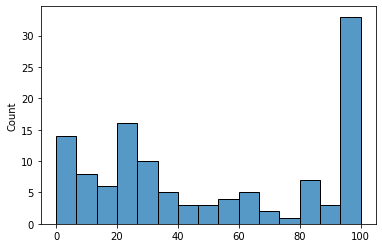

In [ ]:
import seaborn as sns
sns.histplot(proc_per_img,bins=15)

In [ ]:
f'Prosecno pozitivnih delova na slikama tj piksela na kojoj se nalazi suma je :{np.average(np.round(proc_per_img,2))}%'

'Prosecno pozitivnih delova na slikama tj piksela na kojoj se nalazi suma je :51.620000000000005%'

Dataset je izbalaznsiran 52% pozitivnih, 48% negativnih slucajeva.

In [ ]:
def conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):
    """
    Convolutional downsampling block
    
    Arguments:
        inputs -- Input tensor
        n_filters -- Number of filters for the convolutional layers
        dropout_prob -- Dropout probability
        max_pooling -- Use MaxPooling2D to reduce the spatial dimensions of the output volume
    Returns: 
        next_layer, skip_connection --  Next layer and skip connection outputs
    """

    conv = Conv2D(n_filters, # Number of filters
                  3,# Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(inputs)
    conv = Conv2D(n_filters, # Number of filters
                  3,# Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(conv)

    
    # if dropout_prob > 0 add a dropout layer, with the variable dropout_prob as parameter
    if dropout_prob > 0:
  
        conv = Dropout(dropout_prob)(conv)
 
         
        
    # if max_pooling is True add a MaxPooling2D with 2x2 pool_size
    if max_pooling:
   
        next_layer = MaxPooling2D(2,strides=2)(conv)
     
        
    else:
        next_layer = conv
        
    skip_connection = conv
    
    return next_layer, skip_connection

In [ ]:
def upsampling_block(expansive_input, contractive_input, n_filters=32):
    """
    Convolutional upsampling block
    
    Arguments:
        expansive_input -- Input tensor from previous layer
        contractive_input -- Input tensor from previous skip layer
        n_filters -- Number of filters for the convolutional layers
    Returns: 
        conv -- Tensor output
    """
    
    up = Conv2DTranspose(
                 n_filters,    # number of filters
                 3,# Kernel size
                 strides=2,
                 padding='same')(expansive_input)
    
    # Merge the previous output and the contractive_input
    merge = concatenate([up, contractive_input], axis=-1)
    
    conv = Conv2D(n_filters, # Number of filters
                  3,# Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(merge)
    conv = Conv2D(n_filters, # Number of filters
                  3,# Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer= 'he_normal')(conv)
    
    return conv

In [ ]:
def unet_model(input_size=(256, 256, 3), n_filters=64, n_classes=1):
    """
    Unet model
    
    Arguments:
        input_size -- Input shape 
        n_filters -- Number of filters for the convolutional layers
        n_classes -- Number of output classes
    Returns: 
        model -- tf.keras.Model
    """
    #Input 
    inputs = Input(input_size)
    # Contracting Path (encoding)
    #Convblock1 MaxPooling
    cblock1 = conv_block(inputs=inputs, n_filters=n_filters*1)
    
    # Convblock2 Double n_filters MaxPooling
    cblock2 = conv_block(inputs=cblock1[0], n_filters=n_filters*2)
    # Convblock3 Double n_filters MaxPooling
    cblock3 = conv_block(inputs=cblock2[0], n_filters=n_filters*4)
    # Convblock4 Double n_filters MaxPooling adding dropout
    cblock4 = conv_block(inputs=cblock3[0], n_filters=n_filters*8,dropout_prob=0.3)
    # Bottleneck layer
    cblock5 = conv_block(inputs=cblock4[0], n_filters=n_filters*16,dropout_prob=0.3, max_pooling=False) 
    
    # Expanding Path (decoding)
    # Transposeblock1 , conncat convblock4 same n_filters as block 4
    ublock6 = upsampling_block(cblock5[0], cblock4[1], n_filters*8)
   # Transposeblock2, conncat convblock3 same filters as block 3 
    ublock7 = upsampling_block(ublock6, cblock3[1], n_filters*4)
    # Transposeblock3 , concat convblock2 same filters as block 2
    ublock8 = upsampling_block(ublock7, cblock2[1], n_filters*2)
    # Transposeblock4, conncat convblock1 same filters
    ublock9 = upsampling_block(ublock8, cblock1[1], n_filters*1)

    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)

    
    conv10 = Conv2D(n_classes, 1, padding='same',activation="sigmoid")(conv9)
    
    
    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

In [ ]:
img_height = 256
img_width = 256
num_channels = 3

unet = unet_model((img_height, img_width, num_channels))

In [ ]:
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

In [ ]:
def adjustData(img, mask):
  
    mask[mask > 0.5] = 1 # FOREST
    mask[mask <= 0.5] = 0 # NON-FOREST

    return (img,mask)

In [ ]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

(256, 256, 1)
(256, 256, 3)


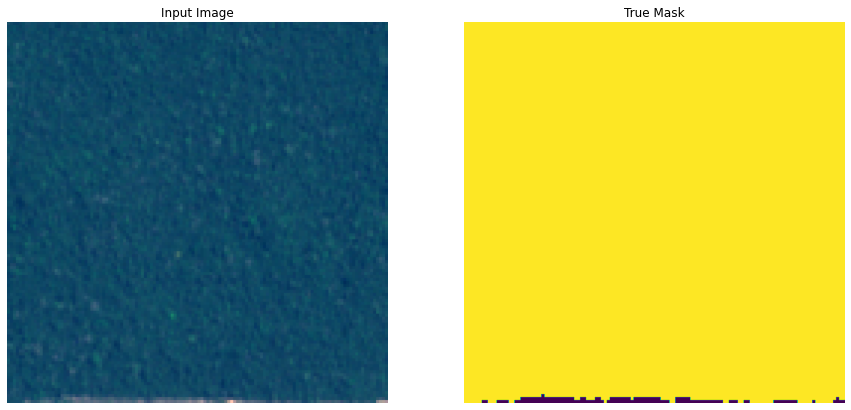

(256, 256, 1)
(256, 256, 3)


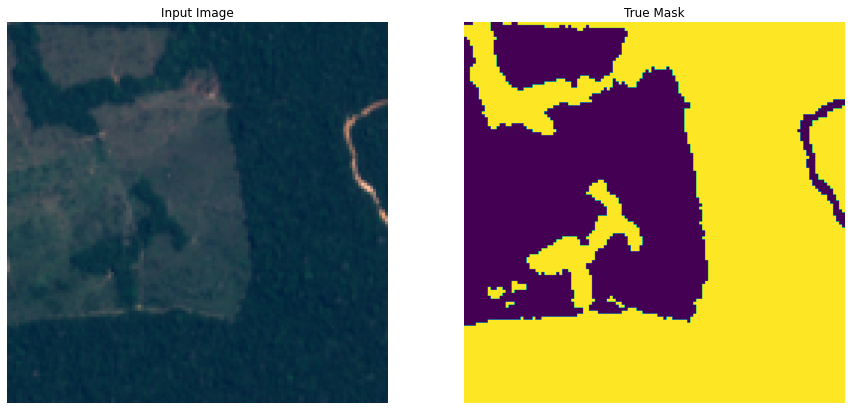

(256, 256, 1)
(256, 256, 3)


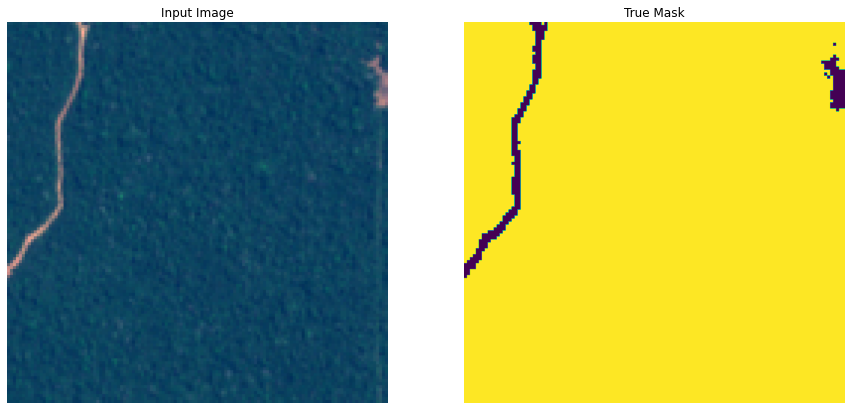

In [ ]:
for image, mask in image_ds.take(3):
    sample_image, sample_mask = image, mask
    print(mask.shape)
    print(image.shape)
    display([sample_image, sample_mask])

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau,ModelCheckpoint 
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=4,verbose=0,mode="auto",)
save_model = ModelCheckpoint('./drive/MyDrive/ColabNotebooks/u-model/unet-3d.hdf5', monitor='val_accuracy',verbose=1, save_best_only=True)

In [ ]:
unet.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall()])

In [ ]:
EPOCHS = 30
BUFFER_SIZE = 500
BATCH_SIZE = 20
train_dataset = image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
validation_dataset= image_val_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
print(image_ds.element_spec)
model_history = unet.fit(train_dataset,validation_data=validation_dataset, epochs=EPOCHS,callbacks=[reduce_lr,save_model])


(TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None))
Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 0.5824 - accuracy: 0.6302 - precision: 0.8594 - recall: 0.3390  
Epoch 1: val_accuracy improved from -inf to 0.50842, saving model to ./drive/MyDrive/ColabNotebooks/u-model/unet-3d.hdf5
6/6 [==============================] - 921s 156s/step - loss: 0.5824 - accuracy: 0.6302 - precision: 0.8594 - recall: 0.3390 - val_loss: 0.8653 - val_accuracy: 0.5084 - val_precision: 0.4777 - val_recall: 1.0000 - lr: 0.0010
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 0.9167 - accuracy: 0.6393 - precision: 0.6188 - recall: 0.7848  
Epoch 2: val_accuracy improved from 0.50842 to 0.66778, saving model to ./drive/MyDrive/ColabNotebooks/u-model/unet-3d.hdf5
6/6 [==============================] - 909s 155s/step - loss: 0.9167 - accuracy: 0.6393 - precision: 0.6188 - recall: 0.7848 - val_loss: 0.5879

In [ ]:
import h5py
from keras.models import load_model
unet=load_model('./drive/MyDrive/ColabNotebooks/u-model/unet-3d.hdf5')

In [ ]:
model_history = unet.fit(train_dataset,validation_data=validation_dataset,initial_epoch=8, epochs=EPOCHS,callbacks=[reduce_lr,save_model])

Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 0.1513 - accuracy: 0.9495 - precision: 0.9559 - recall: 0.9458  
Epoch 9: val_accuracy improved from -inf to 0.89858, saving model to ./drive/MyDrive/ColabNotebooks/u-model/unet-3d.hdf5
6/6 [==============================] - 815s 138s/step - loss: 0.1513 - accuracy: 0.9495 - precision: 0.9559 - recall: 0.9458 - val_loss: 0.2510 - val_accuracy: 0.8986 - val_precision: 0.8339 - val_recall: 0.9670 - lr: 1.0000e-04
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 0.1465 - accuracy: 0.9500 - precision: 0.9515 - recall: 0.9516  
Epoch 10: val_accuracy did not improve from 0.89858
6/6 [==============================] - 803s 137s/step - loss: 0.1465 - accuracy: 0.9500 - precision: 0.9515 - recall: 0.9516 - val_loss: 0.2658 - val_accuracy: 0.8930 - val_precision: 0.8228 - val_recall: 0.9712 - lr: 1.0000e-04
Epoch 11/30
6/6 [==============================] - ETA: 0s - loss: 0.1455 - accuracy: 0.9483 - precision: 

In [ ]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [ ]:
plt.plot(model_history.history["accuracy"])

NameError: ignored

In [ ]:
def show_predictions(dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = unet.predict(image)
            display([image[0], mask[0],np.where(pred_mask[0]>0.50,1,0)]) #create_mask(pred_mask)]
            print(pred_mask[0].shape,image[0].shape)
    else:
        display([sample_image, sample_mask,
             create_mask(unet.predict(sample_image[tf.newaxis, ...]))])

In [ ]:
def show_test_prediction(dataset=None,num=1):
  for image in dataset.take(num):
            pred_mask = unet.predict(image)
            display([image[0],np.where(pred_mask[0]>0.50,1,0)]) #create_mask(pred_mask)

In [ ]:
def show_final_deforestation(dataset=None):
  deforestation=[]
  for image in dataset:
            pred_mask = unet.predict(image)
            deforestation.append(np.sum(np.where(pred_mask[0]>0.49,1,0)/(256*256))) #create_mask(pred_mask)
  return deforestation

In [ ]:
for im,mask in train_dataset.take(1):
  pred_mask=unet.predict(im)
  print(pred_mask[0])

In [ ]:
pred_mask[0].shape
np.min(pred_mask[0])

0.000116430936

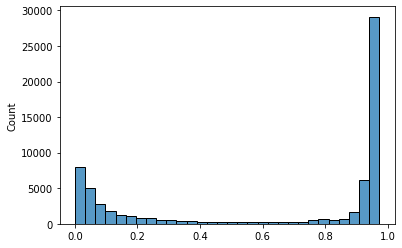

In [ ]:
sns.histplot(pred_mask[0].flatten(), bins=30)

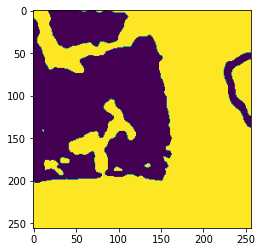

In [ ]:
plt.imshow(tf.keras.preprocessing.image.array_to_img(np.where(pred_mask[0]>0.55,1,0)))  #np.where(pred_mask[0]>0.55,1,0)

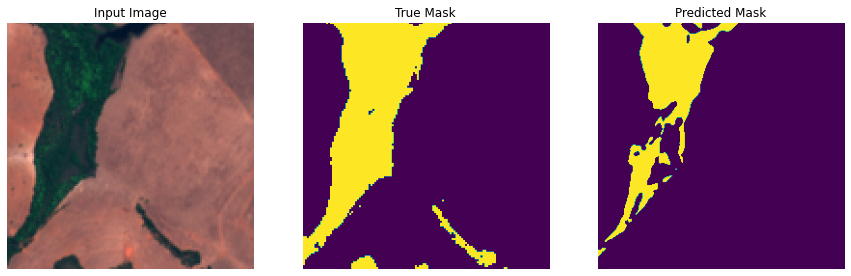

(256, 256, 1) (256, 256, 3)


In [ ]:
show_predictions(train_dataset, 1)

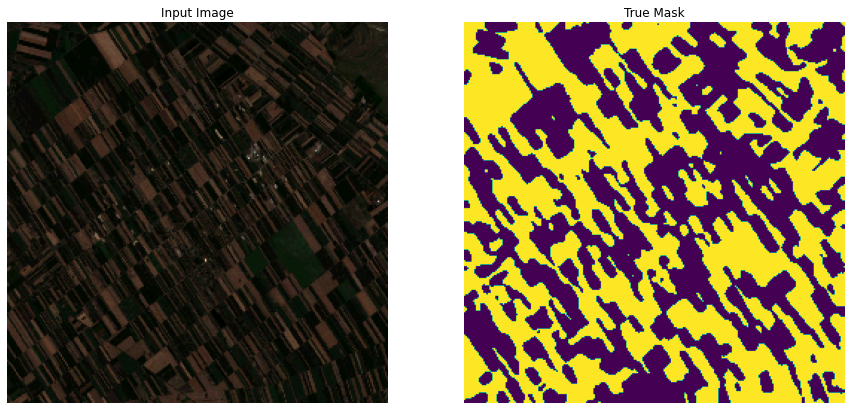

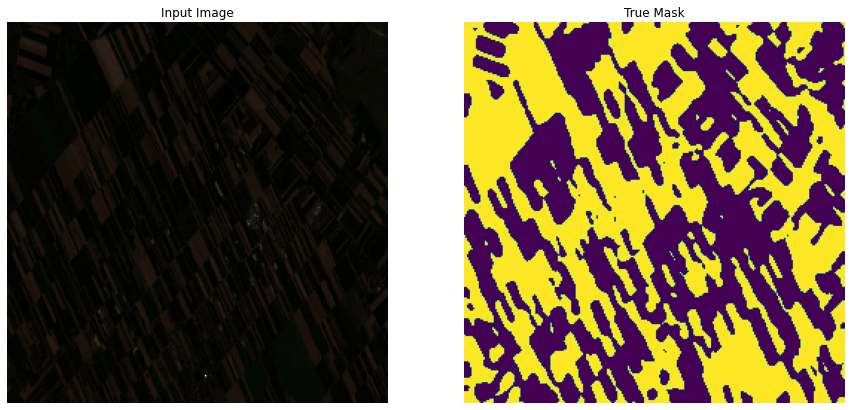

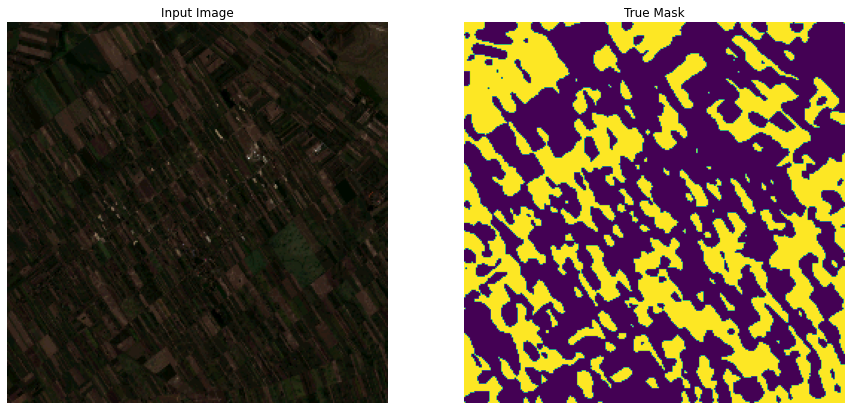

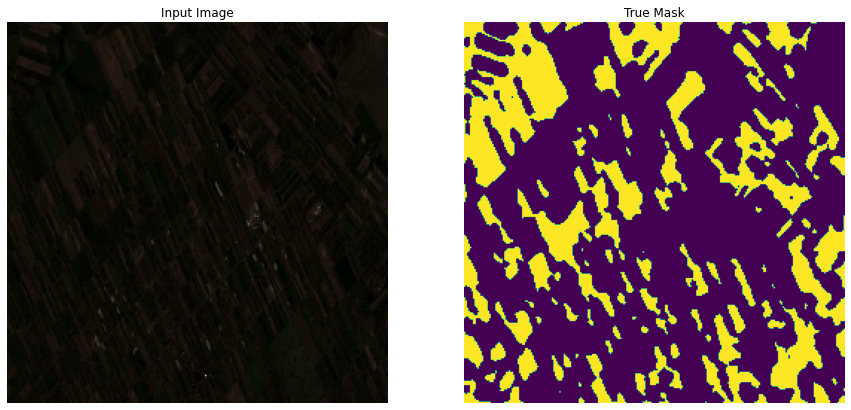

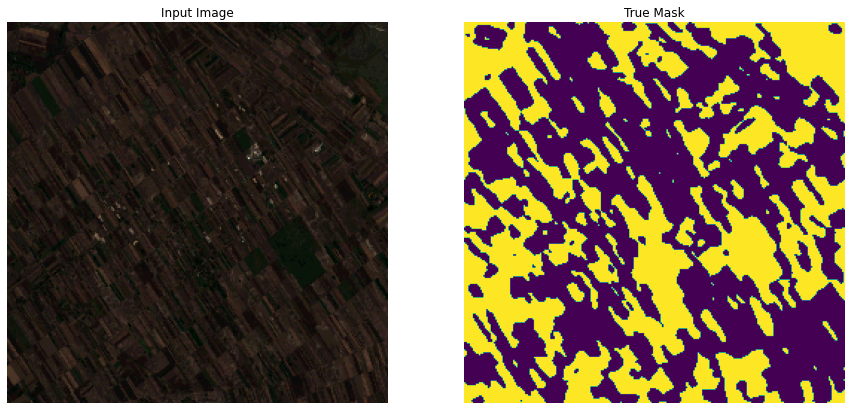

...

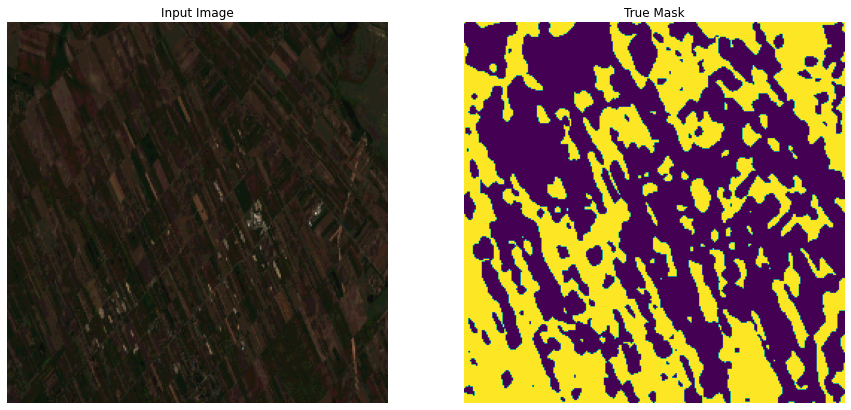

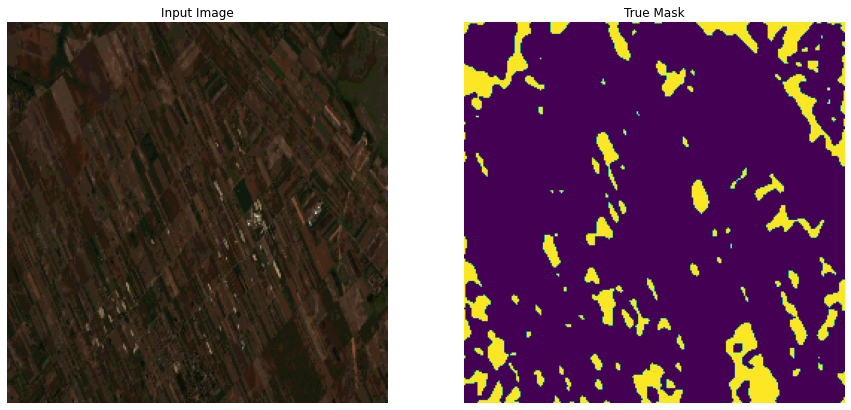

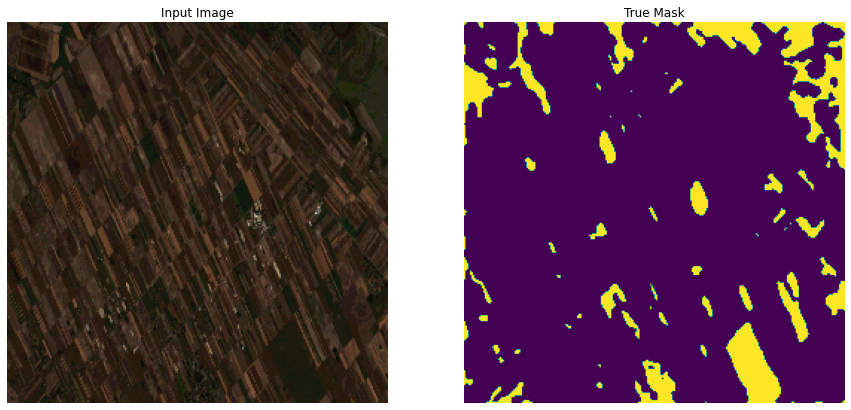

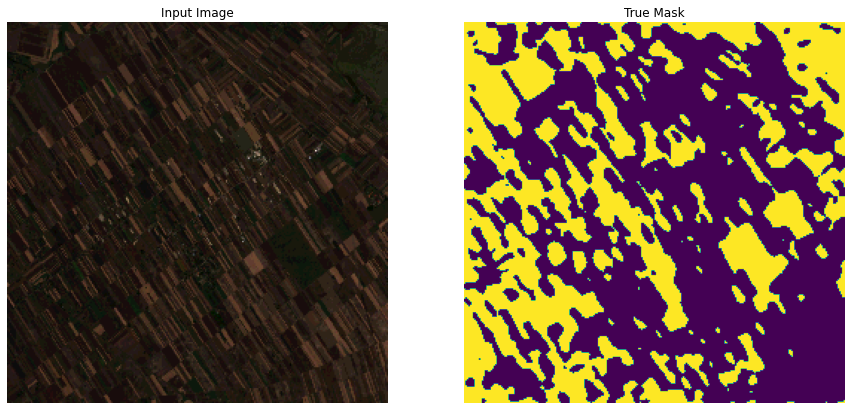

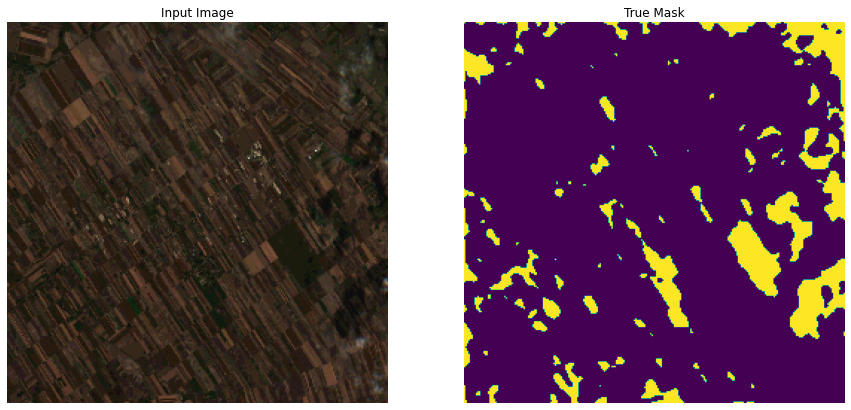

In [ ]:
final_ds=image_final_ds.batch(1)
show_test_prediction(final_ds, 30)

In [ ]:
final_ds=image_final_ds.batch(1)
deforestation=show_final_deforestation(final_ds)

In [ ]:
len(deforestation)

82

In [ ]:
import plotly.graph_objs as go

x=pd.date_range("04-07-2017","03-07-2022",periods=82)
y=deforestation
y_upper = np.asarray(deforestation)*(1+1-0.8909)
y_lower = np.asarray(deforestation)*0.8909

fig = go.Figure([
    go.Scatter(
        name='Deforestation',
        x=x,
        y=y,
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='Upper Bound',
        x=x,
        y=y_upper,
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=x,
        y=y_lower,
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
])
fig.update_layout(
    yaxis_title='Forest (%) of Area',
    title='Area deforestation',
    hovermode="x"
)
fig.show()

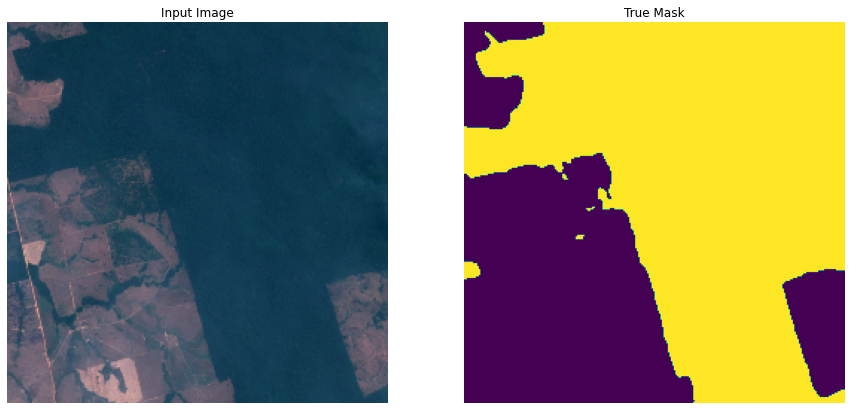

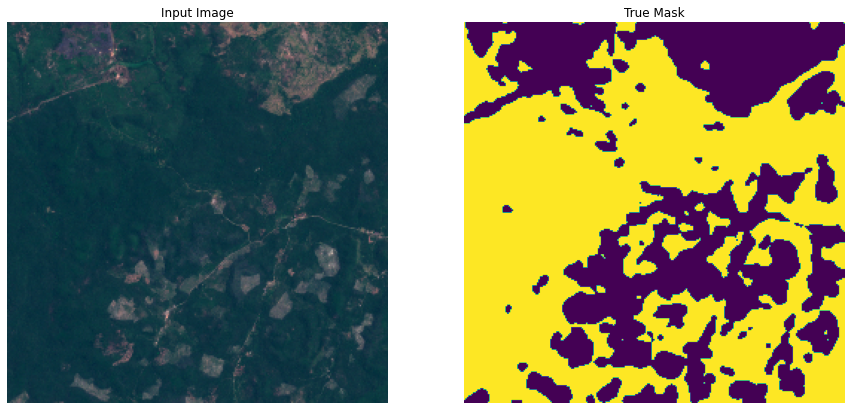

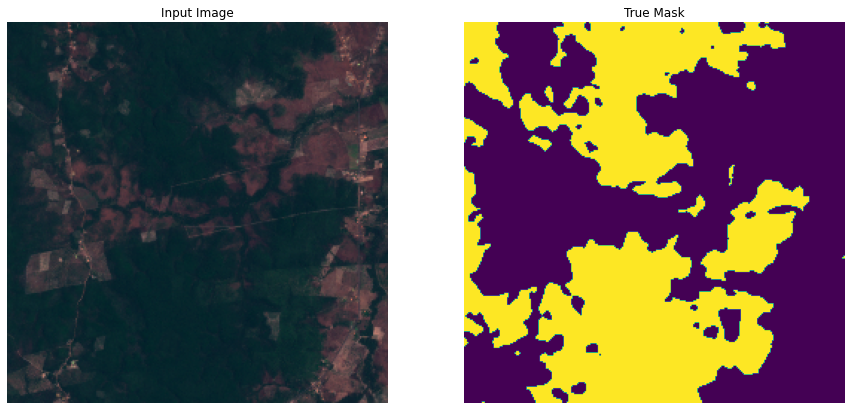

In [ ]:
test_ds=image_test_ds.batch(1)
show_test_prediction(test_ds, 3)